<a href="https://colab.research.google.com/github/duybluemind1988/project_py/blob/main/Churn/Churn_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [75]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn as sk
from sklearn import model_selection
from sklearn import preprocessing
from sklearn import pipeline
from sklearn import compose
from sklearn import metrics
from sklearn.model_selection import StratifiedKFold,train_test_split,cross_val_score,cross_validate
#ML normal ML
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC

#ML ensembles
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier

from sklearn.metrics import classification_report,confusion_matrix,accuracy_score
from sklearn.metrics import recall_score,precision_score,roc_curve,auc,precision_recall_curve
from sklearn.metrics import f1_score,balanced_accuracy_score,average_precision_score
from sklearn.metrics import make_scorer

# explain
import shap
import dalex as dx

# OOP python for feature engineering
from sklearn.base import BaseEstimator, TransformerMixin

In [76]:
path='https://raw.githubusercontent.com/rstudio/keras-customer-churn/master/data/WA_Fn-UseC_-Telco-Customer-Churn.csv'
df=pd.read_csv(path)
df.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [92]:
target="Churn"
X = df.drop(columns=target)
y= df[target]
print(X.shape)
print(y.shape)
X_train_a, X_test, y_train_a, y_test = model_selection.train_test_split(X,y, test_size=0.2, 
                                    random_state=2018, stratify=y)

X_train, X_val, y_train, y_val = model_selection.train_test_split(X_train_a, y_train_a,test_size=0.2, 
                                    random_state=2018, stratify=y_train_a)

(7043, 20)
(7043,)


In [78]:
# Drop columns features
class DropSomeColumns(BaseEstimator, TransformerMixin):

    def __init__(self, feature_name):
        self.feature_name = feature_name

    def fit(self, X: pd.DataFrame, y: pd.Series):
        # there is nothing to fit
        return self

    def transform(self, X:pd.DataFrame):
        X = X.copy() # creating a copy to avoid changes to original dataset
        X = X.drop(columns=self.feature_name)
        #X = X[self.feature_name]
        return X

In [79]:
# Remove "" in object column and convert to number
class Convert_to_number(BaseEstimator, TransformerMixin):

    def __init__(self, feature_name):
        self.feature_name = feature_name

    def fit(self, X: pd.DataFrame, y: pd.Series):
        # there is nothing to fit
        return self

    def transform(self, X:pd.DataFrame):
        X = X.copy() # creating a copy to avoid changes to original dataset
        X[self.feature_name] = X[self.feature_name].replace(' ', np.nan).astype(float)
        #X = X[self.feature_name]
        return X

In [80]:
pipe=pipeline.Pipeline(steps=[
                    ("DropSomeColumns",DropSomeColumns("customerID")),
                    ("Convert_to_number",Convert_to_number("TotalCharges"))
                    ]
             )

In [93]:
X_train=pipe.transform(X_train)
X_val=pipe.transform(X_val)
X_test=pipe.transform(X_test)

In [94]:
# Define categorical columns
categorical = list(X_train.select_dtypes('object').columns)
# Define numerical columns
numerical = list(X_train.select_dtypes('number').columns)

In [95]:
# Combine categorical and numerical pipelines
preprocessor = compose.ColumnTransformer(transformers=[
                                                #('cat', preprocessing.OneHotEncoder(), categorical),
                                                ('cat', preprocessing.OrdinalEncoder(), categorical),
                                                ('num', preprocessing.StandardScaler(), numerical)
                                                      ])

In [96]:
preprocessor.fit(X_train)

ColumnTransformer(transformers=[('cat', OrdinalEncoder(),
                                 ['gender', 'Partner', 'Dependents',
                                  'PhoneService', 'MultipleLines',
                                  'InternetService', 'OnlineSecurity',
                                  'OnlineBackup', 'DeviceProtection',
                                  'TechSupport', 'StreamingTV',
                                  'StreamingMovies', 'Contract',
                                  'PaperlessBilling', 'PaymentMethod']),
                                ('num', StandardScaler(),
                                 ['SeniorCitizen', 'tenure', 'MonthlyCharges',
                                  'TotalCharges'])])

In [91]:
# Transform data in case one hot encoder
cat_columns = preprocessor.named_transformers_['cat'].get_feature_names(categorical)
columns = np.append(cat_columns, numerical)

# transform x_train, val, test
X_train= pd.DataFrame(preprocessor.transform(X_train), columns=columns)
X_val= pd.DataFrame(preprocessor.transform(X_val), columns=columns)
X_test= pd.DataFrame(preprocessor.transform(X_test), columns=columns)

In [97]:
# Transform data in case Ordinal encoder
#columns=X_train.columns
#X_train= pd.DataFrame(preprocessor.transform(X_train), columns=columns)
#X_val= pd.DataFrame(preprocessor.transform(X_val), columns=columns)
#X_test= pd.DataFrame(preprocessor.transform(X_test), columns=columns)

In [99]:
# Label encoder target
le = preprocessing.LabelEncoder()
le.fit(y_train)
y_train=le.transform(y_train)
y_val=le.transform(y_val)
y_test=le.transform(y_test)

In [100]:
#Lgbm dung duoc neu convert object to category, khong can phai remove NaN value
model=LGBMClassifier()
model.fit(X_train,y_train)
y_pred=model.predict(X_test)
y_pred_probs=model.predict_proba(X_test)
print(metrics.confusion_matrix(y_test,y_pred))
print('Balanced Accuracy score:',metrics.balanced_accuracy_score(y_test,y_pred))
print('f1 macro score:',metrics.f1_score(y_test,y_pred,average="macro")) # good for imbalance dataset
print('precision macro score:',metrics.precision_score(y_test,y_pred,average="macro"))
print('recall macro score:',metrics.recall_score(y_test,y_pred,average="macro"))
#fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred_probs[:,1],pos_label='Yes') # convert label to yes/no
fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred_probs[:,1])
print("AUC:",metrics.auc(fpr, tpr))
print("MCC:",metrics.matthews_corrcoef(y_test,y_pred))
print(classification_report(y_test,y_pred))

[[907 128]
 [172 202]]
Balanced Accuracy score: 0.7082177271435584
f1 macro score: 0.7159762836501247
precision macro score: 0.7263571769595866
recall macro score: 0.7082177271435584
AUC: 0.8344002686713685
MCC: 0.4341961626231045
              precision    recall  f1-score   support

           0       0.84      0.88      0.86      1035
           1       0.61      0.54      0.57       374

    accuracy                           0.79      1409
   macro avg       0.73      0.71      0.72      1409
weighted avg       0.78      0.79      0.78      1409



In [101]:
#df[df["TotalCharges"]==" "] # 488,753,936,1082,1340,3331
#df[df["Churn"]=="Yes"] # 2,5,8,7032,7034

In [102]:
test1 =df.iloc[[1]] # NO, No Na in Total charge (convert to data frame)
test2 = df.iloc[[488]] # NO, Na in total charge (convert to data frame)
test3 = df.iloc[[2]] # YES, 
test4 = df.iloc[[4]] # YES

In [103]:
def process_data(data,columns):
    data_transform = pipe.transform(data)
    data_transform = pd.DataFrame(preprocessor.transform(data_transform), columns=columns)
    return data_transform

In [104]:
customerA = process_data(test1,columns) # NO
customerB = process_data(test4,columns) # YES
customerA

/home/dnn/anaconda3/lib/python3.8/site-packages/sklearn/compose/_column_transformer.py:437: FutureWarning:

Given feature/column names or counts do not match the ones for the data given during fit. This will fail from v0.24.

/home/dnn/anaconda3/lib/python3.8/site-packages/sklearn/compose/_column_transformer.py:437: FutureWarning:

Given feature/column names or counts do not match the ones for the data given during fit. This will fail from v0.24.



,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges
0,1.0,0.0,0.0,1.0,0.0,0.0,2.0,0.0,2.0,0.0,0.0,0.0,1.0,0.0,3.0,-0.42989,0.053112,-0.255407,-0.176572


In [105]:
customerB

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges
0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,-0.42989,-1.246951,0.205322,-0.946131


In [106]:
model_exp = dx.Explainer(model, X_train, y_train, 
                          label = "model Pipeline")

Preparation of a new explainer is initiated

  -> data              : 4507 rows 19 cols
  -> target variable   : 4507 values
  -> model_class       : lightgbm.sklearn.LGBMClassifier (default)
  -> label             : model Pipeline
  -> predict function  : <function yhat_proba_default at 0x7f69c86c2820> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 0.000316, mean = 0.266, max = 0.958
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.868, mean = -0.00018, max = 0.921
  -> model_info        : package lightgbm

A new explainer has been created!


In [107]:
#bd_henry = model_exp.predict_parts(customerA, 
#             type = 'break_down')
#bd_henry

In [108]:
print(test1["Churn"])
print(model.predict_proba(customerA))
print(test4["Churn"])
print(model.predict_proba(customerB))

1    No
Name: Churn, dtype: object
[[0.95352285 0.04647715]]
4    Yes
Name: Churn, dtype: object
[[0.38538605 0.61461395]]


6 Break-down Plots for Additive Attributions

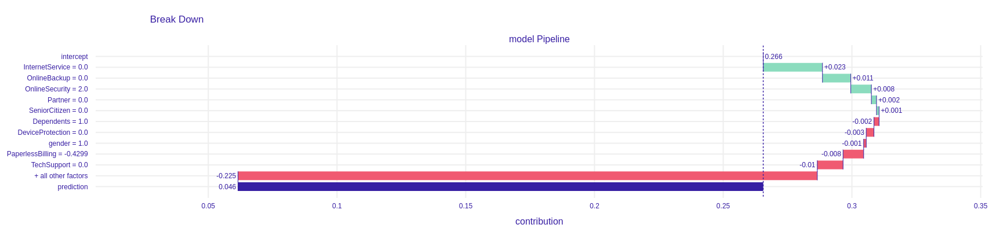

In [109]:
bd_henry = model_exp.predict_parts(customerA, 
             type = 'break_down')
bd_henry.plot() # max_vars =45

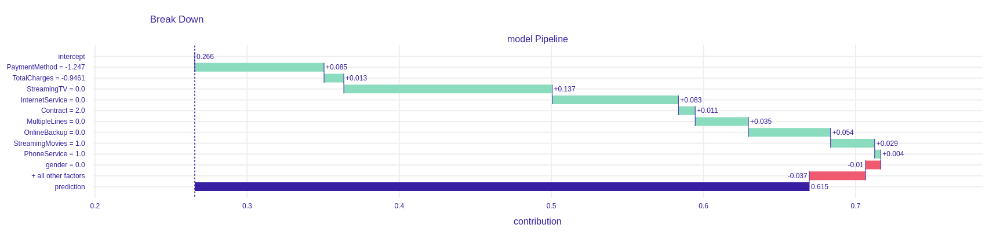

In [110]:
bd_henry = model_exp.predict_parts(customerB, 
             type = 'break_down')
bd_henry.plot()

7 Break-down Plots for Interactions

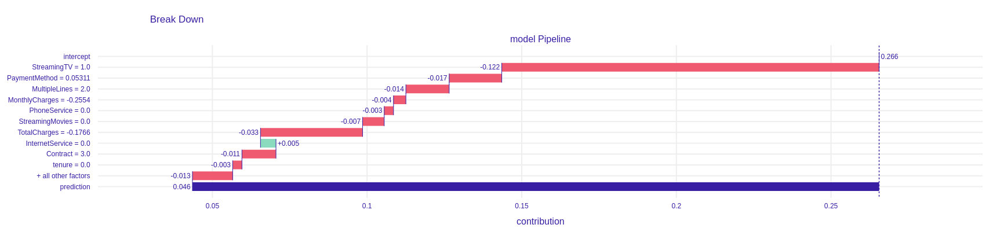

In [111]:
bd_henry = model_exp.predict_parts(customerA, 
             type = 'break_down_interactions')
bd_henry.plot()

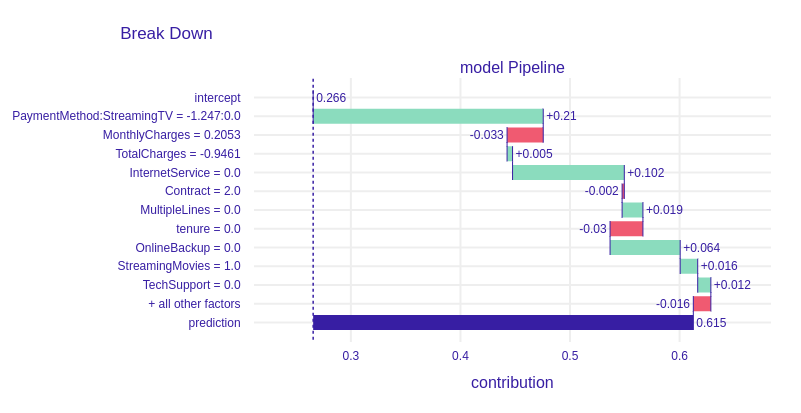

In [112]:
bd_henry = model_exp.predict_parts(customerB, 
             type = 'break_down_interactions')
bd_henry.plot()

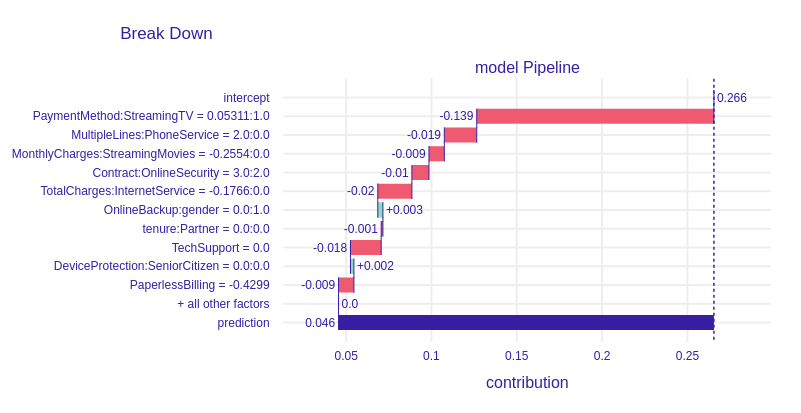

In [113]:
bd_henry = model_exp.predict_parts(customerA, 
             type = 'break_down_interactions',interaction_preference = 10)
bd_henry.plot()

8 Shapley Additive Explanations (SHAP) for Average Attributions

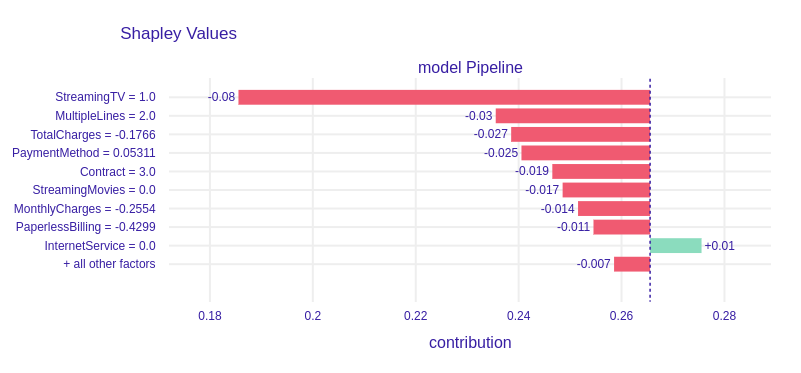

In [114]:
bd_henry = model_exp.predict_parts(customerA, 
             type = 'shap')
bd_henry.plot(max_vars =10)

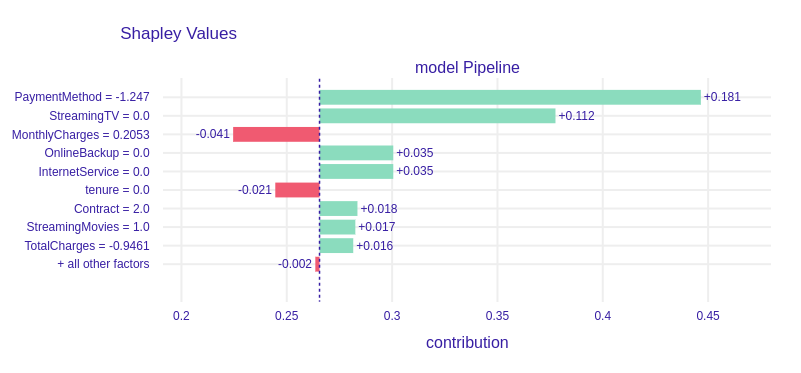

In [115]:
bd_henry = model_exp.predict_parts(customerB, 
             type = 'shap')
bd_henry.plot(max_vars =10)

9 Local Interpretable Model-agnostic Explanations (LIME)

In [116]:
from lime.lime_tabular import LimeTabularExplainer 
explainer = LimeTabularExplainer(X_train, 
                      feature_names=X_train.columns, 
                      #class_names=['No', 'Yes'], 
                      discretize_continuous=False, 
                      mode='classification',           
                      verbose=True)

Intercept 0.1238150874024443
Prediction_local [0.09554744]
Right: 0.0464771519547398


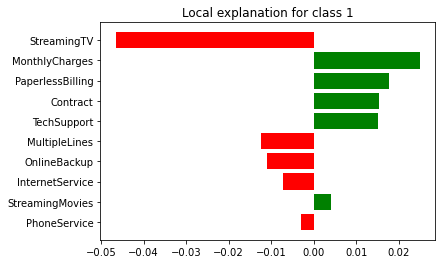

In [117]:
# Must label encoder tareget to use LIME explaination
# Must convert data frame to series (df.squeeze())
lime = explainer.explain_instance(customerA.squeeze(), model.predict_proba) # Must remove NA for LIME explain
lime.show_in_notebook(show_table=True)
lime.as_pyplot_figure()
plt.show()

In [118]:
y_test[0:10]

array([0, 0, 0, 0, 1, 0, 1, 0, 0, 0])

Intercept 0.12276923642415254
Prediction_local [0.2814209]
Right: 0.893932600465401


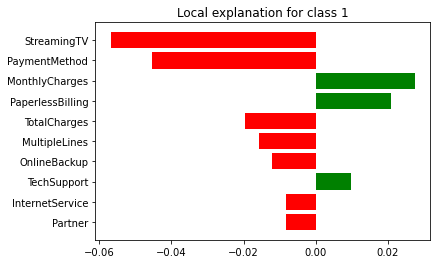

In [119]:
# Must label encoder tareget to use LIME explaination
lime = explainer.explain_instance(X_test.iloc[6], model.predict_proba) # Must remove NA for LIME explain
lime.show_in_notebook(show_table=True)
lime.as_pyplot_figure()
plt.show()

In [120]:
pd.DataFrame(lime.as_list())

,0,1
0,StreamingTV,-0.056826
1,PaymentMethod,-0.045392
2,MonthlyCharges,0.027459
3,PaperlessBilling,0.020712
4,TotalCharges,-0.019496
5,MultipleLines,-0.015756
6,OnlineBackup,-0.012038
7,TechSupport,0.009714
8,InternetService,-0.008352
9,Partner,-0.008334


10 Ceteris-paribus Profiles

In [121]:
cp_henry = model_exp.predict_profile(customerB)
cp_henry.result

Calculating ceteris paribus: 100%|██████████| 19/19 [00:00<00:00, 86.61it/s]


,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,_original_,_yhat_,_vname_,_ids_,_label_
0,0.00,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,-0.42989,-1.246951,0.205322,-0.946131,0.000000,0.614614,gender,0,model Pipeline
0,0.01,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,-0.42989,-1.246951,0.205322,-0.946131,0.000000,0.623568,gender,0,model Pipeline
0,0.02,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,-0.42989,-1.246951,0.205322,-0.946131,0.000000,0.623568,gender,0,model Pipeline
0,0.03,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,-0.42989,-1.246951,0.205322,-0.946131,0.000000,0.623568,gender,0,model Pipeline
0,0.04,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,-0.42989,-1.246951,0.205322,-0.946131,0.000000,0.623568,gender,0,model Pipeline
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,0.00,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,-0.42989,-1.246951,0.205322,2.640608,-0.946131,0.619483,TotalCharges,0,model Pipeline
0,0.00,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,-0.42989,-1.246951,0.205322,2.678583,-0.946131,0.619483,TotalCharges,0,model Pipeline
0,0.00,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,-0.42989,-1.246951,0.205322,2.716557,-0.946131,0.619483,TotalCharges,0,model Pipeline
0,0.00,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,-0.42989,-1.246951,0.205322,2.754532,-0.946131,0.619483,TotalCharges,0,model Pipeline


In [122]:
pd.set_option('display.max_columns', None)
X_train.head()

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges
0,1.0,0.0,0.0,1.0,0.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,3.0,-0.42989,-1.125070,-1.481784,-0.972213
1,1.0,0.0,0.0,0.0,1.0,0.0,2.0,2.0,0.0,2.0,0.0,0.0,0.0,0.0,3.0,-0.42989,-1.165697,-0.742942,-0.948456
2,1.0,1.0,1.0,1.0,2.0,0.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,0.0,1.0,-0.42989,1.596935,0.841966,1.793898
3,1.0,0.0,0.0,1.0,0.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,3.0,-0.42989,0.256246,-1.496863,-0.662946
4,0.0,1.0,0.0,1.0,0.0,0.0,2.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,-0.42989,-1.165697,-0.330799,-0.909200


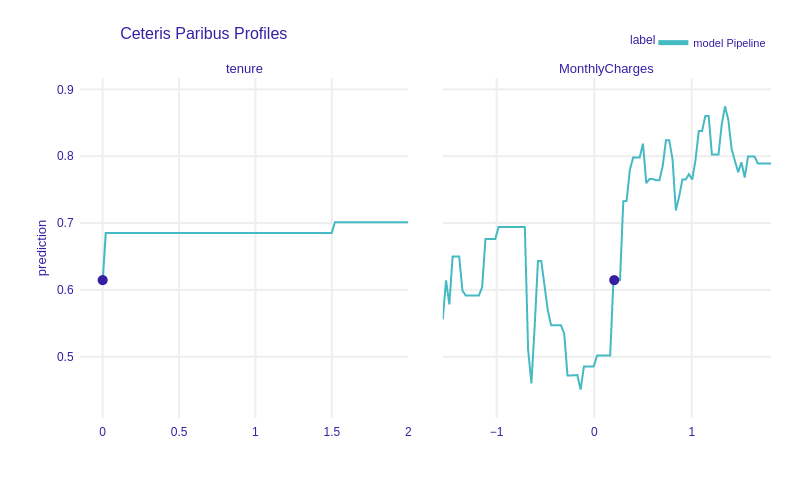

In [123]:
cp_henry.plot(variables = ['tenure', 'MonthlyCharges'])

In [141]:
#cp_henry.plot(variables = ['PaymentMethod'],variable_type = 'categorical')

15 Model-performance Measures

In [125]:
import dalex as dx
model_exp = dx.Explainer(model, X_train, y_train, 
                  label = "Titanic RF Pipeline")

Preparation of a new explainer is initiated

  -> data              : 4507 rows 19 cols
  -> target variable   : 4507 values
  -> model_class       : lightgbm.sklearn.LGBMClassifier (default)
  -> label             : Titanic RF Pipeline
  -> predict function  : <function yhat_proba_default at 0x7f69c86c2820> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 0.000316, mean = 0.266, max = 0.958
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.868, mean = -0.00018, max = 0.921
  -> model_info        : package lightgbm

A new explainer has been created!


In [131]:
mp_rf = model_exp.model_performance(model_type = "classification", 
          cutoff = 0.5)
mp_rf.result

,recall,precision,f1,accuracy,auc
Titanic RF Pipeline,0.755853,0.856061,0.802842,0.901487,0.964225


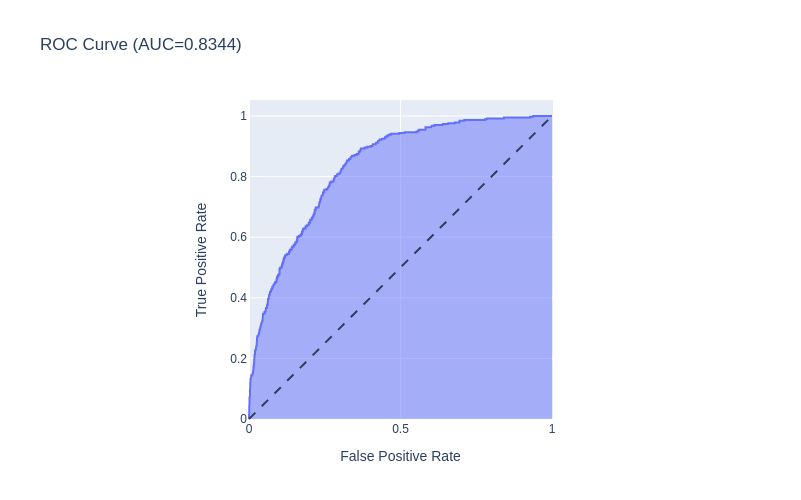

In [133]:
import plotly.express as px
from sklearn.metrics import roc_curve, auc
y_score = model_exp.predict(X_test)
fpr, tpr, thresholds = roc_curve(y_test, y_score)
fig = px.area(x=fpr, y=tpr,
    title=f'ROC Curve (AUC={auc(fpr, tpr):.4f})',
    labels=dict(x='False Positive Rate', y='True Positive Rate'),
    width=700, height=500)
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1)
fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_xaxes(constrain='domain')
fig.show()

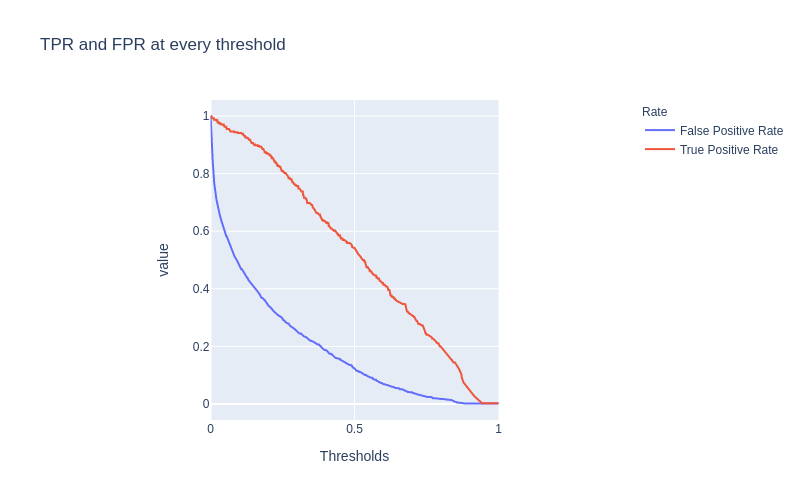

In [134]:
df = pd.DataFrame({'False Positive Rate': fpr,
        'True Positive Rate': tpr }, index=thresholds)
df.index.name = "Thresholds"
df.columns.name = "Rate"
fig_thresh = px.line(df, 
    title='TPR and FPR at every threshold', width=700, height=500)
fig_thresh.update_yaxes(scaleanchor="x", scaleratio=1)
fig_thresh.update_xaxes(range=[0, 1], constrain='domain')
fig_thresh.show()

16 Variable-importance Measures

In [135]:
model_exp = dx.Explainer(model, X_train, y_train, 
                  label = "Titanic RF Pipeline")

Preparation of a new explainer is initiated

  -> data              : 4507 rows 19 cols
  -> target variable   : 4507 values
  -> model_class       : lightgbm.sklearn.LGBMClassifier (default)
  -> label             : Titanic RF Pipeline
  -> predict function  : <function yhat_proba_default at 0x7f69c86c2820> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 0.000316, mean = 0.266, max = 0.958
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.868, mean = -0.00018, max = 0.921
  -> model_info        : package lightgbm

A new explainer has been created!


In [136]:
mp_rf = model_exp.model_parts()
mp_rf.result

,variable,dropout_loss,label
0,_full_model_,0.034842,Titanic RF Pipeline
1,Dependents,0.036446,Titanic RF Pipeline
2,DeviceProtection,0.037221,Titanic RF Pipeline
3,OnlineSecurity,0.038751,Titanic RF Pipeline
4,SeniorCitizen,0.039943,Titanic RF Pipeline
5,TechSupport,0.040015,Titanic RF Pipeline
6,Partner,0.040897,Titanic RF Pipeline
7,PhoneService,0.040948,Titanic RF Pipeline
8,PaperlessBilling,0.042493,Titanic RF Pipeline
9,tenure,0.042640,Titanic RF Pipeline


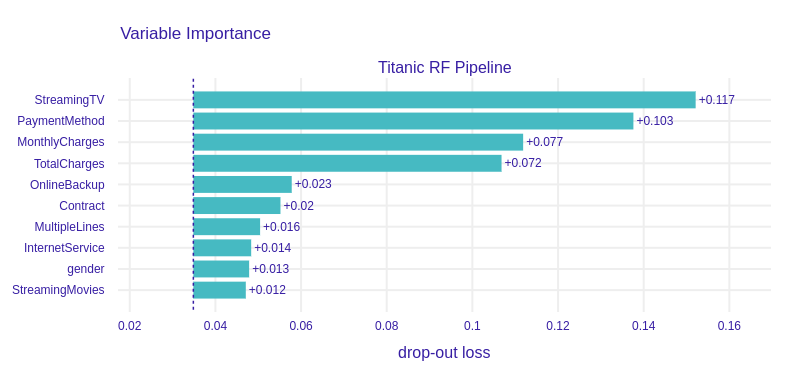

In [137]:
mp_rf.plot()

In [138]:
vi_grouped = model_exp.model_parts(
                variable_groups={'Finance': ['PaymentMethod', 'tenure'],
                                   'Technical': ['TechSupport', 'OnlineBackup']})
vi_grouped.result

,variable,dropout_loss,label
0,_full_model_,0.034842,Titanic RF Pipeline
1,Technical,0.064531,Titanic RF Pipeline
2,Finance,0.141989,Titanic RF Pipeline
3,_baseline_,0.504469,Titanic RF Pipeline


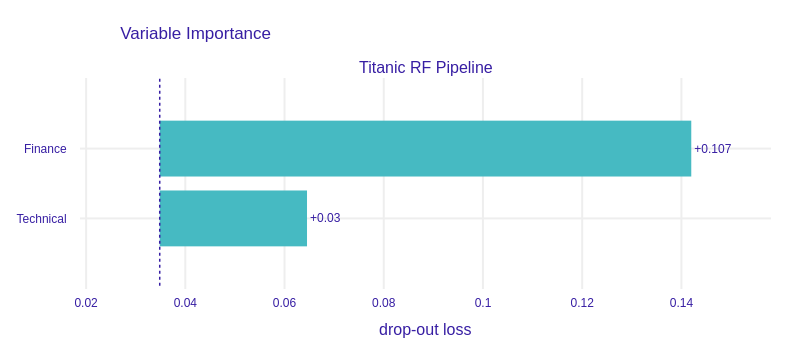

In [139]:
vi_grouped.plot()

17 Partial-dependence Profiles

In [142]:
model_exp = dx.Explainer(model, X_train, y_train, 
                  label = "Titanic RF Pipeline")

Preparation of a new explainer is initiated

  -> data              : 4507 rows 19 cols
  -> target variable   : 4507 values
  -> model_class       : lightgbm.sklearn.LGBMClassifier (default)
  -> label             : Titanic RF Pipeline
  -> predict function  : <function yhat_proba_default at 0x7f69c86c2820> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 0.000316, mean = 0.266, max = 0.958
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.868, mean = -0.00018, max = 0.921
  -> model_info        : package lightgbm

A new explainer has been created!


In [143]:
pd_rf = model_exp.model_profile(variables = ['MonthlyCharges', 'tenure'])
pd_rf.result

Calculating ceteris paribus: 100%|██████████| 2/2 [00:00<00:00,  8.48it/s]


,_vname_,_label_,_x_,_yhat_,_ids_
0,MonthlyCharges,Titanic RF Pipeline,-1.552150,0.154672,0
1,MonthlyCharges,Titanic RF Pipeline,-1.518508,0.198875,0
2,MonthlyCharges,Titanic RF Pipeline,-1.484867,0.186569,0
3,MonthlyCharges,Titanic RF Pipeline,-1.451225,0.201502,0
4,MonthlyCharges,Titanic RF Pipeline,-1.417584,0.201502,0
...,...,...,...,...,...
197,tenure,Titanic RF Pipeline,1.920000,0.266601,0
198,tenure,Titanic RF Pipeline,1.940000,0.266601,0
199,tenure,Titanic RF Pipeline,1.960000,0.266601,0
200,tenure,Titanic RF Pipeline,1.980000,0.266601,0


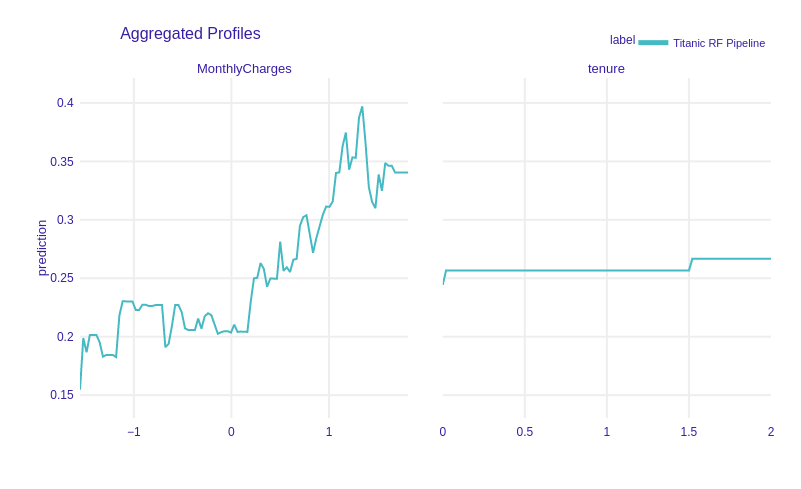

In [144]:
pd_rf.plot()

In [146]:
#pd_rf.plot(geom = 'profiles')

In [151]:
#mp_rf = model_exp.model_profile( variable_type = 'categorical')
#mp_rf.plot(variables = ['PaymentMethod'])

Calculating ceteris paribus: 100%|██████████| 2/2 [00:00<00:00,  9.73it/s]


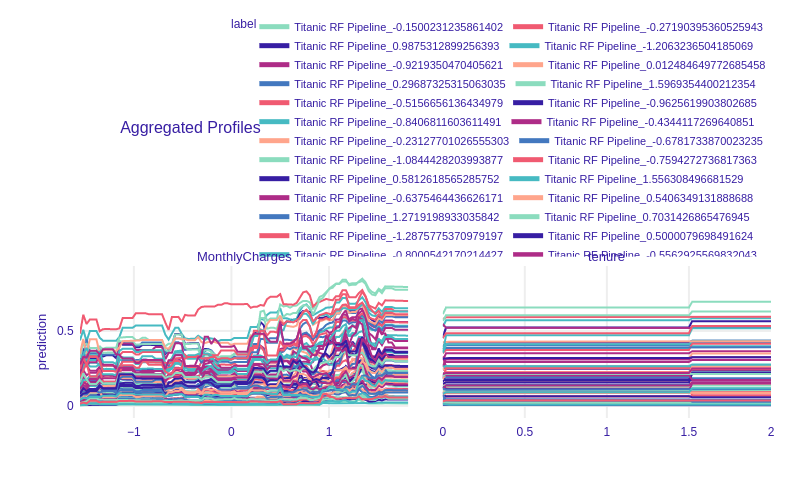

In [147]:
mp_rf = model_exp.model_profile(groups = 'PaymentMethod', 
                                  variables = ['MonthlyCharges', 'tenure'])
mp_rf.plot()